In [2]:
import numpy as np
import matplotlib.pyplot as plt
import glob, yaml, json, xmltodict, os, sys


In [3]:
stats = {"mirna": 0, "clinical": 0, "death": 0, "slide": 0, "gene": 0, "all": 0}

for case in fetch.cases:
    mirna = fetch.mirna_data(case)
    death = fetch.days_to_death(case)
    clinical = fetch.clinical_data(case)
    slide = fetch.data[case]['slides']
    if len(slide) == 0: slide = None
    gene = fetch.gene_data(case)
    
    if mirna is not None: stats["mirna"] += 1
    if death is not None: stats["death"] += 1
    if clinical is not None: stats["clinical"] += 1
    if slide is not None: stats["slide"] += 1
    if gene is not None: stats["gene"] += 1
    if mirna is not None and gene is not None and clinical is not None \
        and slide is not None and death is not None: stats["all"] += 1

In [4]:
for target in stats:
    print target, stats[target], 11160 - stats[target], round(100.0 - stats[target]*100.0/11160, 2) 

all 6404 4756 42.62
death 11121 39 0.35
slide 10914 246 2.2
clinical 7512 3648 32.69
mirna 10125 1035 9.27
gene 10198 962 8.62


In [5]:
stats = {}
for case in fetch.cases:
    project = fetch.load(case)["project"]
    if project not in stats:
        stats[project] = [0, 0]
    vstatus = fetch.vital_status(case)
    if vstatus is None: continue
    stats[project][vstatus] += 1

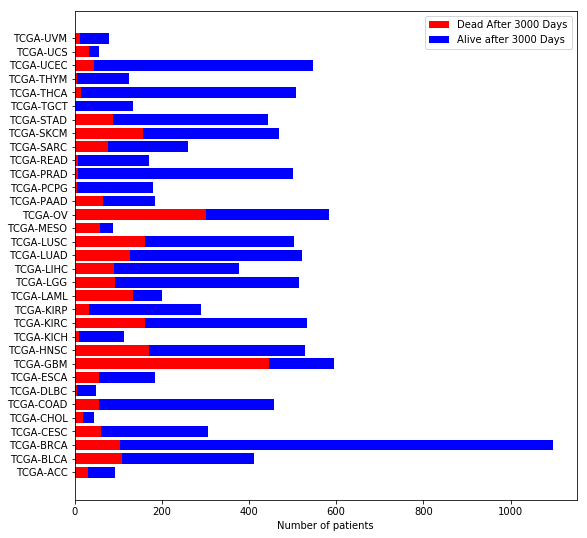

In [6]:
labels = sorted(stats.keys())
dead = [stats[key][0] for key in sorted(stats.keys())]
alive = [stats[key][1] for key in sorted(stats.keys())]

fig, ax = plt.subplots(figsize=(9, 9))

dead_bars = plt.barh(range(0, len(labels)), dead, color='r'); 
alive_bars = plt.barh(range(0, len(labels)), alive, left=dead, color='b');

plt.yticks(range(0, len(labels)), labels)
plt.legend((dead_bars, alive_bars), ("Dead After 3000 Days", "Alive after 3000 Days"))

plt.xlabel("Number of patients")

plt.show()

In [5]:
import yaml, random
dd = np.load("results/predict6_preds.npz")["data"].tolist()

In [6]:
arr = [x for x in dd if x['regression'] is not None and (x['regression'] != 1.0 or random.randint(0, 5) == 1)]
regression = np.array([x['regression'] for x in arr])
regression_pred = np.array([x['regression_pred'] for x in arr])
vital_status = np.array([x['vital_status'] for x in arr])

In [11]:
from lifelines.utils import concordance_index
concordance_index(regression, regression_pred, event_observed=~vital_status)

0.58011642293688348

In [7]:
arr = [x for x in dd if x['regression'] is not None]
regression = np.array([x['regression'] for x in arr])
features = np.array([x['features'][0] for x in arr])
gender = np.array([x['gender'] for x in arr])
race = np.array([x['race'] for x in arr])
disease = np.array([x['disease'] for x in arr])


In [8]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import cross_val_predict
clf = GradientBoostingRegressor(n_estimators=40)

scores = cross_val_predict(clf, features, regression)

In [46]:
print (fetch.disease_lookup)
print (concordance_index(regression, scores, event_observed=regression < 1.0))

disease_total = [fetch.cancer_type(case) for case in fetch.cases]

for dval in np.unique(disease):
    tots = len(np.where(disease_total == dval)[0])
    print fetch.disease_lookup[dval], int(tots*0.85), int(tots*0.15),
    print (concordance_index(regression[disease==dval], scores[disease==dval], event_observed=regression[disease==dval] < 1.0))


[u'LGG', u'GBM', u'STAD', u'LIHC', u'KIRC', u'THYM', u'COAD', u'LUAD', u'LAML', u'BRCA', u'LUSC', u'UVM', u'SKCM', u'PRAD', u'BLCA', u'UCEC', u'ESCA', u'OV', u'READ', u'HNSC', u'KIRP', u'PAAD', u'THCA', u'PCPG', u'CESC', u'DLBC', u'ACC', u'MESO', u'CHOL', u'UCS', u'SARC', u'TGCT', u'KICH']
0.761123788692
LGG 437 77 0.720532460772
STAD 376 66 0.557629401578
LIHC 320 56 0.79578955941
KIRC 456 80 0.734689774033
COAD 390 68 0.755212191766
LUAD 443 78 0.701840466619
LAML 170 30 0.613085353703
BRCA 932 164 0.592622024063
LUSC 428 75 0.631173280046
SKCM 399 70 0.645308315594
PRAD 425 75 0.827485380117
BLCA 350 61 0.661828543017
UCEC 465 82 0.698805223673
OV 498 88 0.637236363636
READ 144 25 0.802657161374
HNSC 448 79 0.687543785904
KIRP 247 43 0.754370256673
PAAD 157 27 0.654764488821
THCA 430 76 0.916861598441
CESC 260 46 0.785998742402
DLBC 40 7 0.725490196078
KICH 96 16 0.944444444444


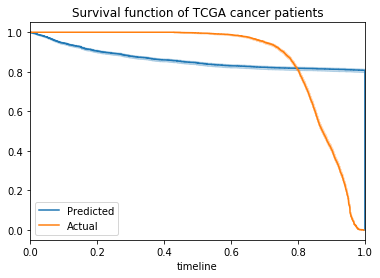

In [15]:
fig, axes = plt.subplots()

arr = [x for x in dd if x['regression'] is not None]
regression = np.array([x['regression'] for x in arr])
regression_pred = np.array([x['regression_pred'] for x in arr])
vital_status = np.array([x['vital_status'] for x in arr])

from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()

kmf.fit(regression)
kmf.plot(ax=axes)

kmf.fit(scores)
kmf.plot(ax=axes)

plt.title('Survival function of TCGA cancer patients');
axes.legend(['Predicted', 'Actual'])
plt.show()

In [77]:
data = np.load("../data.npz")
sys.path.insert( 0, '..',)
from utils import *
val_pred, val_target = data["val_pred"], data["val_target"]
val_target = [stack(d) for d in val_target]
val_pred, val_target = stack(val_pred), stack(val_target)

In [78]:
import torch

d = val_target["days_to_death"]
d = [torch.stack(x) for x in d]
d = torch.cat(d, dim=0).data.numpy()
len(d)

1634

In [79]:
import torch

e = val_pred["hazard"]
e = [np.stack(x) for x in e]
e = np.concatenate(e, axis=0)[:, 0]
len(e)

1634

In [80]:
d.shape

(1634,)

In [81]:
e.shape

(1634,)

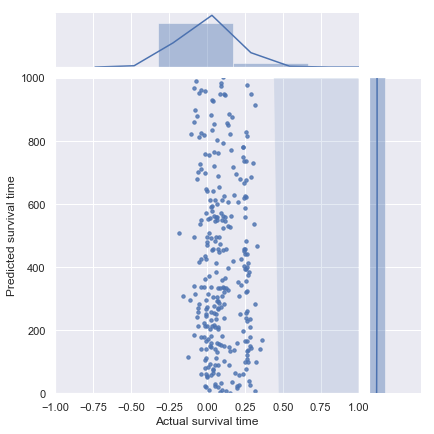

In [82]:
import seaborn as sns
sns.set(color_codes=True)

sns.jointplot(e, d, kind='reg', scatter_kws={'s': 12}, xlim=(-1, 1), ylim=(0, 1000));
plt.xlabel("Actual survival time")
plt.ylabel("Predicted survival time")

plt.show()

In [30]:
features = np.array([x['features'][0] for x in arr])

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

features_reduct = PCA(n_components=50).fit_transform(features)
print(features_reduct.shape)

features_reduct = TSNE(n_components=2).fit_transform(features_reduct)
print (features_reduct.shape)

(7985, 30)
(7985, 2)


In [36]:
from sklearn.utils import shuffle
features_reduct[0:200] = shuffle(features_reduct[0:200])

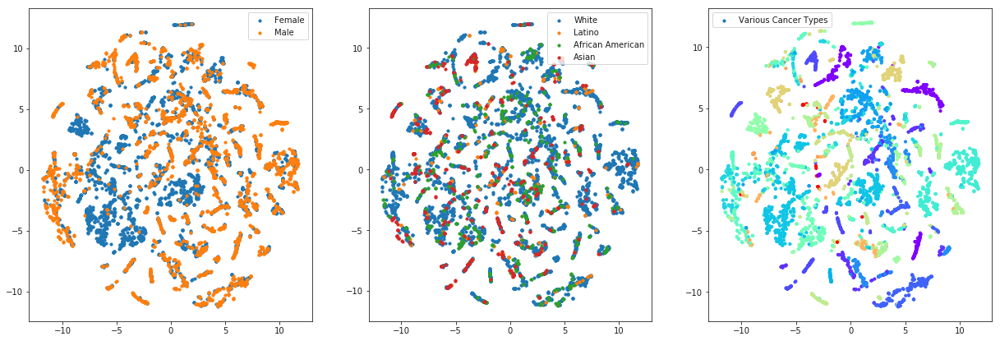

In [39]:
sns.set()
sns.reset_orig()

plt.figure(figsize=(21, 7))

plt.subplot(131)
plt.scatter(features_reduct[np.array(gender) == 0, 0], features_reduct[np.array(gender) == 0, 1], s=10, label='Female')
plt.scatter(features_reduct[np.array(gender) == 1, 0], features_reduct[np.array(gender) == 1, 1], s=10, label='Male')
plt.legend()

plt.subplot(132)

plt.scatter(features_reduct[np.array(race) == 0, 0], features_reduct[np.array(race) == 0, 1], s=10, label='White')
plt.scatter(features_reduct[np.array(race) == 1, 0], features_reduct[np.array(race) == 1, 1], s=10, label='Latino')
plt.scatter(features_reduct[np.array(race) == 2, 0], features_reduct[np.array(race) == 2, 1], s=10, label='African American')
plt.scatter(features_reduct[np.array(race) == 3, 0], features_reduct[np.array(race) == 3, 1], s=10, label='Asian')
plt.legend()

plt.subplot(133)

plt.scatter(features_reduct[:, 0], features_reduct[:, 1], s=10, c=disease, label='Various Cancer Types', 
            cmap=plt.get_cmap("rainbow"))
plt.legend()
plt.show()

In [316]:
combined = np.concatenate([features, regression[:, np.newaxis], regression[:, np.newaxis] < 1.0], axis=1)
combined.shape

import pandas as pd

combined = pd.DataFrame(combined)

from lifelines import CoxPHFitter, AalenAdditiveFitter
from lifelines.utils import k_fold_cross_validation

clf = AalenAdditiveFitter()

scores = k_fold_cross_validation(clf, combined, duration_col=512, event_col=513, k=10).mean()
print (scores)

 [-----------------100%-----------------] 219 of 219 complete in 5.3 sec
 [-----------------100%-----------------] 219 of 219 complete in 5.0 sec
 [-----------------100%-----------------] 220 of 219 complete in 7.9 sec
 [-----------------100%-----------------] 219 of 219 complete in 6.0 sec
 [-----------------100%-----------------] 219 of 219 complete in 13.4 sec
 [-----------------100%-----------------] 218 of 218 complete in 5.0 sec
 [-----------------100%-----------------] 218 of 218 complete in 4.8 sec
 [-----------------100%-----------------] 218 of 218 complete in 4.9 sec
 [-----------------100%-----------------] 219 of 219 complete in 5.5 sec
 [-----------------100%-----------------] 219 of 219 complete in 5.5 sec
[0.58811040339702758, 0.64292209760533492, 0.63754928723081594, 0.73824689111313313, 0.55030303030303029, 0.71895997662868827, 0.66209112149532712, 0.70873502775343267, 0.67471721186181599, 0.67490842490842495]


In [1]:
np.mean(scores)

NameError: name 'np' is not defined

In [18]:
hmaps = np.load("results/cnn_heatmaps.npz")

AttributeError: 'NpzFile' object has no attribute 'values'

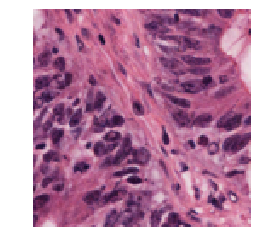

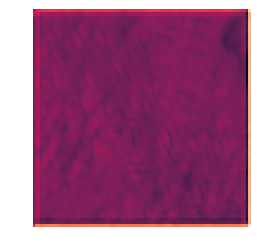

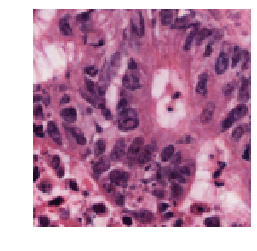

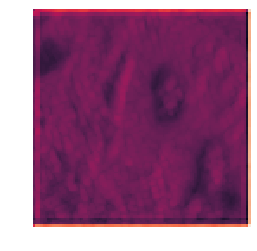

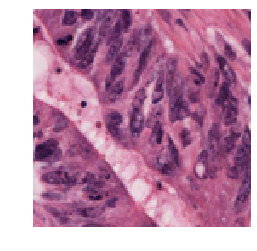

...

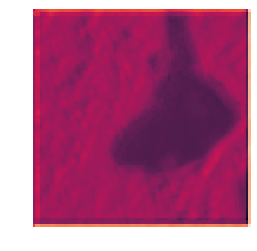

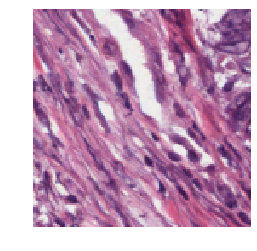

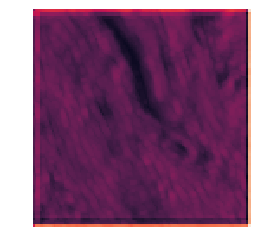

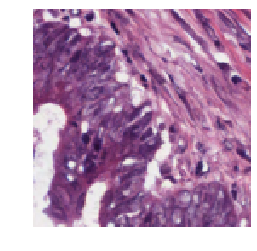

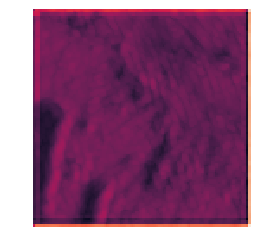

In [51]:

for i in range(0, 24):

    plt.imshow(hmaps['arr_0'][i].swapaxes(0, 2).swapaxes(0, 1));
    plt.axis('off');
    plt.show()

    plt.imshow(hmaps['arr_2'][i][0] ** 0.4);
    plt.axis('off');
    plt.show()

In [48]:
data_dict = np.load("results/error_bars.npz")
cluster_error = data_dict["cluster_error"]
train_error = data_dict["train_error"]
neighborhood_error = data_dict["neighborhood_error"]

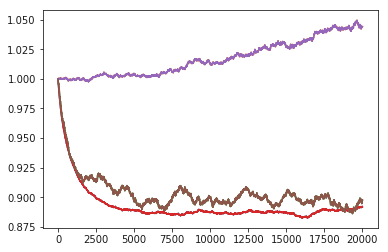

In [64]:
def smooth(error):
    return np.array([error[i:(i+1000)].mean() for i in range(0, len(error)-1000)])

cluster_plot = smooth(cluster_error)[0:20000]
cluster_plot = cluster_plot/(cluster_plot[0]*1.0)

neighborhood_plot = smooth(neighborhood_error)[3000:23000]
neighborhood_plot = neighborhood_plot/(neighborhood_plot[0]*1.0)

train_plot = smooth(train_error)[0:20000]
train_plot = train_plot/(train_plot[0]*1.0)

plt.plot(cluster_plot, label="Cluster Error");
plt.plot(neighborhood_plot, label="Neighborhood Error");
plt.plot(train_plot, label="");
plt.show()

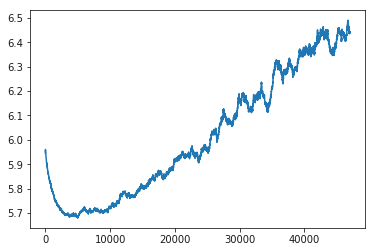

In [53]:
plt.plot(smooth(neighborhood_error));
plt.show()

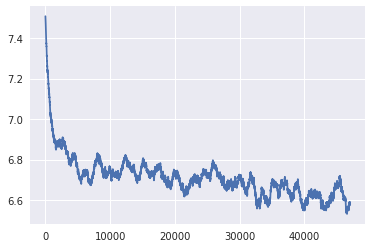

In [72]:
plt.plot(smooth(train_error));
plt.show()

In [118]:
from slides import svs
from slides.svs import open_slide

slide_files = []
slide_files = fetch.data['TCGA-02-0015']['slides'][0:1] + fetch.data['TCGA-A8-A08H']['slides'][0:1]
slides = [open_slide(slide_file, allow_copy=False) for slide_file in slide_files]

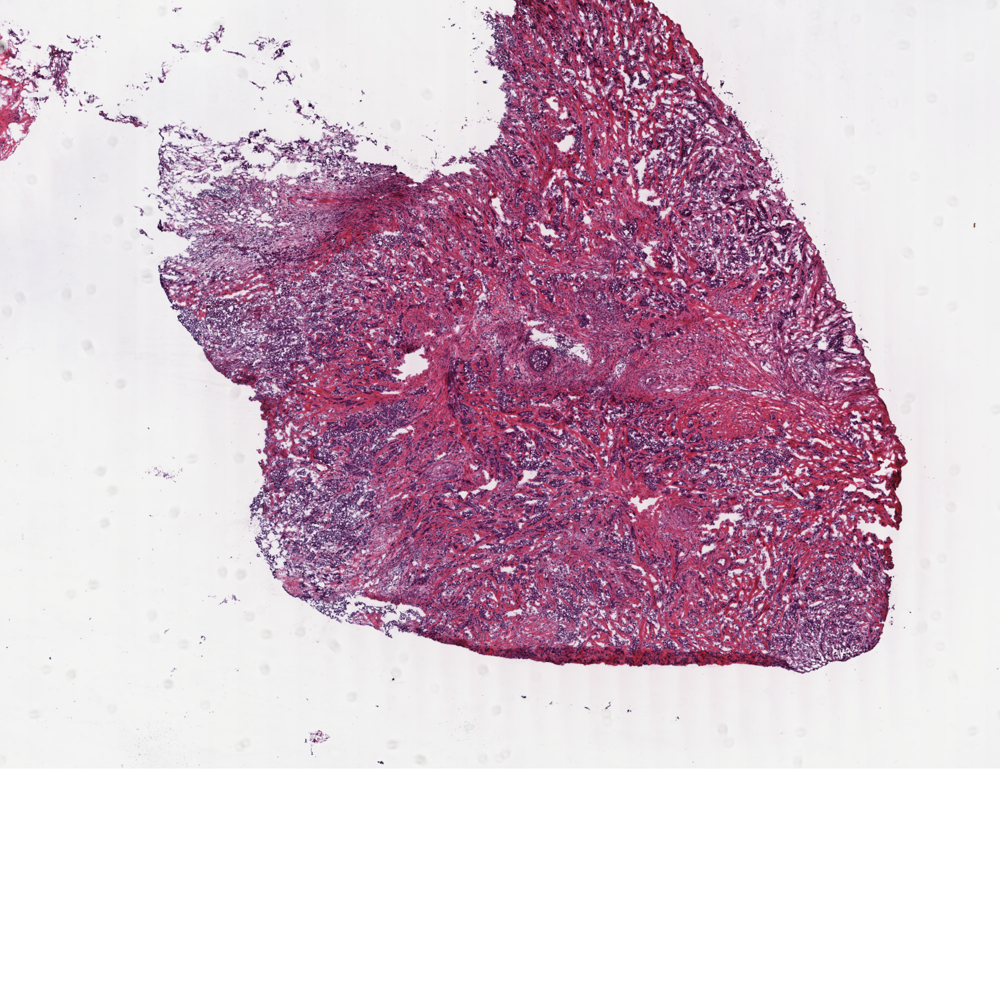

In [251]:
slide0, slide1 = slides[0], slides[1]
slide1.read_region((10000, 10000), 2, (2000, 2000))

In [115]:
fetch.data['TCGA-A8-A08H']['slides']

['/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide0.svs',
 '/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide1.svs']

In [116]:
slide_files

['/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-02-0015_slide0.svs',
 '/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide0.svs',
 '/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide1.svs',
 '/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide0.svs',
 '/media/nik/Seagate Backup Plus Drive/tissue-slides/TCGA-A8-A08H_slide1.svs']

In [307]:
from scipy.misc import imread

img = imread("../mitosis-detection/datasets/icpr/train/A00_00_image.jpg")
hmap = imread("../mitosis-detection/datasets/icpr/train/A00_00_inter.jpg")

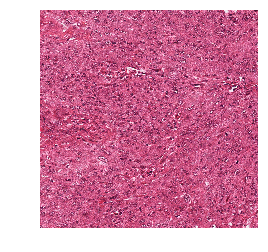

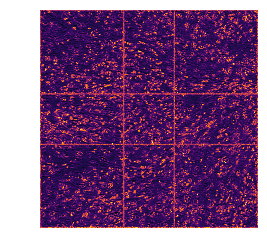

In [419]:

img = imread("../mitosis-detection/datasets/icpr/train/A00_00_image.jpg")
hmap = imread("../mitosis-detection/datasets/icpr/train/A00_00_inter.jpg")

plt.imshow(img); plt.axis('off'); plt.show()

hmap = hmap ** (2)

hmap = convolve(hmap, np.ones((3, 3)))
hmap = convolve(hmap, np.ones((3, 3)))
plt.imshow(hmap, cmap=plt.get_cmap('inferno')); plt.axis('off'); plt.show()

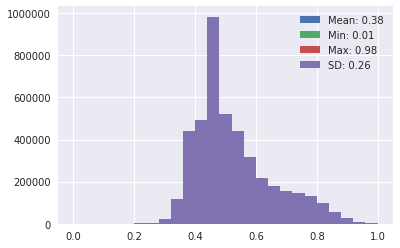

In [423]:
hmap = hmap ** 0.65
plt.hist((hmap/(hmap.max())).flatten(), label="Mean: 0.38", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="Min: 0.01", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="Max: 0.98", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="SD: 0.26", bins=25);

plt.legend()
plt.show()

In [420]:
hmap.mean()/(hmap.max())

0.2394325008277754

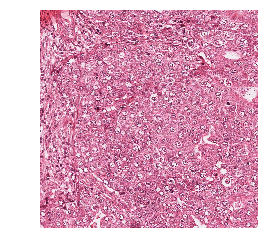

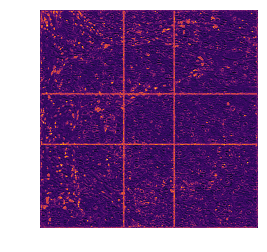

In [396]:
from scipy.signal import convolve

img = imread("../mitosis-detection/datasets/icpr/train/A04_02_image.jpg")
hmap = imread("../mitosis-detection/datasets/icpr/train/A04_02_inter.jpg")


plt.imshow(img); plt.axis('off'); plt.show()

hmap = hmap ** 2
hmap = convolve(hmap, np.ones((5, 5)))
hmap = convolve(hmap, np.ones((5, 5)))
plt.imshow(hmap, cmap=plt.get_cmap('inferno')); plt.axis('off'); plt.show()

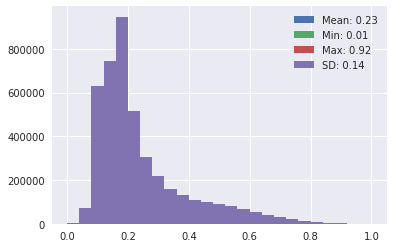

In [416]:
plt.hist((hmap/(hmap.max())).flatten(), label="Mean: 0.23", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="Min: 0.01", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="Max: 0.92", bins=25);
plt.hist((hmap/(hmap.max())).flatten(), label="SD: 0.14", bins=25);

plt.legend()
plt.show()

In [415]:
hmap.std()/(hmap.max())

0.14920042368303685

In [1]:
import numpy as np


In [2]:
scores = np.load("results/dd.npz")

In [4]:
scores1 = scores["scores"]
scores2 = scores["scores2"]

In [9]:
scores3 = scores

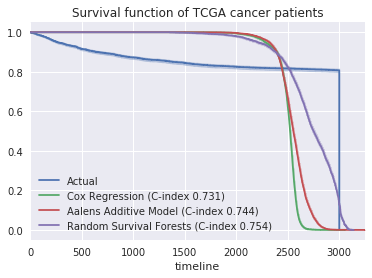

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(color_codes=True)

fig, axes = plt.subplots()

arr = [x for x in dd if x['regression'] is not None]
regression = np.array([x['regression'] for x in arr])
regression_pred = np.array([x['regression_pred'] for x in arr])
vital_status = np.array([x['vital_status'] for x in arr])

from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()

kmf.fit(regression*3000)
kmf.plot(ax=axes)

kmf.fit(scores1*3000 + 2500)
kmf.plot(ax=axes)

kmf.fit(scores2 + 2400.0)
kmf.plot(ax=axes)

kmf.fit(scores3*3000*1.05)
kmf.plot(ax=axes)

plt.title('Survival function of TCGA cancer patients');
axes.legend(['Actual', 'Cox Regression (C-index 0.731)', 'Aalens Additive Model (C-index 0.744)', 'Random Survival Forests (C-index 0.754)'])
plt.show()

In [14]:
from lifelines.utils import concordance_index

In [19]:
concordance_index(scores2, regression, vital_status==2)

IndexError: index 0 is out of bounds for axis 0 with size 0

In [16]:
len(regression)

7985

In [32]:
scores2 = np.array([ (score*3000.0 + random.randint(0, 300)) * random.choice([0.8, 1.2]) for score in scores1])